In [7]:
import shutil
import os
import re
import cv2
# will use them for creating custom directory iterator
import numpy as np
from six.moves import range
# regular expression for splitting by whitespace
splitter = re.compile("\s+")

In [6]:
dataset_path = '/src/dataset/'
base_path = '/src/dataset/process/'
process_path = '/src/dataset/process/'
image_path = '/src/fashion_data/Img/img/'
img_train_path = process_path + 'train/'
img_eval_path = process_path + 'val/'
img_test_path = process_path + 'test/'
anno_path = '/src/fashion_data/Anno/'
eval_path = '/src/fashion_data/Eval/'
log_path = '/src/logs/'
output_path = '/src/output/'

In [3]:
def process_folders():
    # Read the relevant annotation file and preprocess it
    # Assumed that the annotation files are under '<project folder>/data/anno' path
    with open('{}list_eval_partition.txt'.format(eval_path), 'r') as eval_partition_file:
        list_eval_partition = [line.rstrip('\n') for line in eval_partition_file][2:]
        list_eval_partition = [splitter.split(line) for line in list_eval_partition]
        list_all = [(v[0][4:], v[0].split('/')[1].split('_')[-1], v[1]) for v in list_eval_partition]
    print(list_all[0])
    # Put each image into the relevant folder in train/test/validation folder
    for element in list_all:
        if not os.path.exists(os.path.join(base_path, element[2])):
            os.mkdir(os.path.join(base_path, element[2]))
        if not os.path.exists(os.path.join(os.path.join(base_path, element[2]), element[1])):
            os.mkdir(os.path.join(os.path.join(base_path, element[2]), element[1]))
        if not os.path.exists(os.path.join(os.path.join(os.path.join(os.path.join(base_path, element[2]), element[1])),
                              element[0].split('/')[0])):
            os.mkdir(os.path.join(os.path.join(os.path.join(os.path.join(base_path, element[2]), element[1])),
                     element[0].split('/')[0]))
        shutil.move(os.path.join(image_path, element[0]),
                    os.path.join(os.path.join(os.path.join(base_path, element[2]), element[1]), element[0]))

In [4]:
process_folders()

('Sheer_Pleated-Front_Blouse/img_00000001.jpg', 'Blouse', 'train')


IOError: [Errno 2] No such file or directory: '/src/fashion_data/Img/img/Sheer_Pleated-Front_Blouse/img_00000001.jpg'

In [5]:
def create_dict_bboxes(list_all, split='train'):
    lst = [(line[0], line[1], line[3], line[2]) for line in list_all if line[2] == split]
    lst = [("".join(base_path + line[3] + '/' + line[1] + line[0][3:]), line[1], line[2]) for line in lst]
    lst_shape = [cv2.imread(line[0]).shape for line in lst]
#     print("line round")
    lst = [(line[0], line[1], (round(float(line[2][0]) / shape[1], 2), round(float(line[2][1]) / shape[0], 2), round(float(line[2][2]) / shape[1], 2), round(float(line[2][3]) / shape[0], 2)), shape) for line, shape in zip(lst, lst_shape)]
#     for line in lst:
#         print(line)
    dict_ = {"/".join(line[0].split('/')[5:]): {'x1': line[2][0], 'y1': line[2][1], 'x2': line[2][2], 'y2': line[2][3], 'shape': line[3]} for line in lst}
    return dict_

def get_dict_bboxes():
    with open('{}list_category_img.txt'.format(anno_path), 'r') as category_img_file, \
            open('{}/list_eval_partition.txt'.format(eval_path), 'r') as eval_partition_file, \
            open('{}/list_bbox.txt'.format(anno_path), 'r') as bbox_file:
        list_category_img = [line.rstrip('\n') for line in category_img_file][2:]
        list_eval_partition = [line.rstrip('\n') for line in eval_partition_file][2:]
        list_bbox = [line.rstrip('\n') for line in bbox_file][2:]

        list_category_img = [splitter.split(line) for line in list_category_img]
        list_eval_partition = [splitter.split(line) for line in list_eval_partition]
        list_bbox = [splitter.split(line) for line in list_bbox]

        list_all = [(k[0], k[0].split('/')[1].split('_')[-1], v[1], (int(b[1]), int(b[2]), int(b[3]), int(b[4])))
                    for k, v, b in zip(list_category_img, list_eval_partition, list_bbox)]

        list_all.sort(key=lambda x: x[1])
        dict_train = create_dict_bboxes(list_all)
        dict_val = create_dict_bboxes(list_all, split='val')
        dict_test = create_dict_bboxes(list_all, split='test')

        return dict_train, dict_val, dict_test


In [6]:
testStr = '/src/dataset/process/train/Anorak/Hooded_Cotton_Canvas_Anorak/img_00000004.jpg'
"/".join(testStr.split('/')[5:])

'Anorak/Hooded_Cotton_Canvas_Anorak/img_00000004.jpg'

In [7]:
shape = (300, 258, 3)
bb = (64, 51, 218, 290)
round(float(bb[0]) / float(shape[1]), 2)

0.25

In [120]:
list_all = get_dict_bboxes()

line round
('/src/dataset/process/train/Anorak/Hooded_Cotton_Canvas_Anorak/img_00000001.jpg', 'Anorak', (0.21, 0.17, 0.73, 0.97))
('/src/dataset/process/train/Anorak/Hooded_Cotton_Canvas_Anorak/img_00000002.jpg', 'Anorak', (0.28, 0.12, 0.82, 1.0))
('/src/dataset/process/train/Anorak/Hooded_Cotton_Canvas_Anorak/img_00000003.jpg', 'Anorak', (0.18, 0.2, 0.76, 1.0))
('/src/dataset/process/train/Anorak/Hooded_Cotton_Canvas_Anorak/img_00000004.jpg', 'Anorak', (0.14, 0.18, 0.78, 0.93))
('/src/dataset/process/train/Anorak/Hooded_Cotton_Canvas_Anorak/img_00000007.jpg', 'Anorak', (0.19, 0.0, 0.91, 1.0))
('/src/dataset/process/train/Anorak/Hooded_Cotton_Canvas_Anorak/img_00000009.jpg', 'Anorak', (0.16, 0.16, 0.89, 0.86))
('/src/dataset/process/train/Anorak/Hooded_Cotton_Canvas_Anorak/img_00000010.jpg', 'Anorak', (0.13, 0.0, 0.83, 0.88))
('/src/dataset/process/train/Anorak/Hooded_Cotton_Canvas_Anorak/img_00000011.jpg', 'Anorak', (0.21, 0.18, 0.8, 0.99))
('/src/dataset/process/train/Anorak/Hooded_C

('/src/dataset/process/train/Blazer/Dropped_Lapel_Chiffon-Sleeved_Blazer/img_00000055.jpg', 'Blazer', (0.23, 0.18, 0.73, 0.94))
('/src/dataset/process/train/Blazer/Dropped_Lapel_Chiffon-Sleeved_Blazer/img_00000057.jpg', 'Blazer', (0.23, 0.21, 0.78, 0.9))
('/src/dataset/process/train/Blazer/Dropped_Lapel_Chiffon-Sleeved_Blazer/img_00000058.jpg', 'Blazer', (0.2, 0.17, 0.77, 0.61))
('/src/dataset/process/train/Blazer/Dropped_Lapel_Chiffon-Sleeved_Blazer/img_00000059.jpg', 'Blazer', (0.18, 0.18, 0.83, 0.86))
('/src/dataset/process/train/Blazer/Dropped_Lapel_Chiffon-Sleeved_Blazer/img_00000060.jpg', 'Blazer', (0.41, 0.21, 0.89, 0.83))
('/src/dataset/process/train/Blazer/Dropped_Lapel_Chiffon-Sleeved_Blazer/img_00000061.jpg', 'Blazer', (0.08, 0.28, 0.8, 0.98))
('/src/dataset/process/train/Blazer/Dropped_Lapel_Chiffon-Sleeved_Blazer/img_00000062.jpg', 'Blazer', (0.24, 0.07, 1.0, 1.0))
('/src/dataset/process/train/Blazer/Dropped_Lapel_Chiffon-Sleeved_Blazer/img_00000063.jpg', 'Blazer', (0.0, 0

('/src/dataset/process/train/Blouse/Split_V-Neck_Chiffon_Blouse/img_00000098.jpg', 'Blouse', (0.2, 0.17, 0.59, 0.51))
('/src/dataset/process/train/Blouse/Split_V-Neck_Chiffon_Blouse/img_00000100.jpg', 'Blouse', (0.0, 0.3, 1.0, 0.87))
('/src/dataset/process/train/Blouse/Split_V-Neck_Chiffon_Blouse/img_00000101.jpg', 'Blouse', (0.01, 0.04, 0.99, 1.0))
('/src/dataset/process/train/Blouse/Split-Back_Pleated_Blouse/img_00000001.jpg', 'Blouse', (0.06, 0.26, 0.89, 0.9))
('/src/dataset/process/train/Blouse/Split-Back_Pleated_Blouse/img_00000002.jpg', 'Blouse', (0.13, 0.26, 0.83, 0.91))
('/src/dataset/process/train/Blouse/Split-Back_Pleated_Blouse/img_00000003.jpg', 'Blouse', (0.22, 0.23, 0.84, 0.86))
('/src/dataset/process/train/Blouse/Split-Back_Pleated_Blouse/img_00000004.jpg', 'Blouse', (0.1, 0.33, 0.82, 0.7))
('/src/dataset/process/train/Blouse/Split-Back_Pleated_Blouse/img_00000005.jpg', 'Blouse', (0.19, 0.22, 0.8, 0.94))
('/src/dataset/process/train/Blouse/Split-Back_Pleated_Blouse/img_0

('/src/dataset/process/train/Blouse/Cap-Sleeved_Lace_Blouse/img_00000003.jpg', 'Blouse', (0.07, 0.0, 0.96, 1.0))
('/src/dataset/process/train/Blouse/Cap-Sleeved_Lace_Blouse/img_00000005.jpg', 'Blouse', (0.29, 0.18, 0.71, 0.55))
('/src/dataset/process/train/Blouse/Cap-Sleeved_Lace_Blouse/img_00000006.jpg', 'Blouse', (0.08, 0.01, 0.92, 0.78))
('/src/dataset/process/train/Blouse/Cap-Sleeved_Lace_Blouse/img_00000007.jpg', 'Blouse', (0.15, 0.11, 0.84, 0.77))
('/src/dataset/process/train/Blouse/Cap-Sleeved_Lace_Blouse/img_00000008.jpg', 'Blouse', (0.1, 0.25, 0.94, 0.91))
('/src/dataset/process/train/Blouse/Cap-Sleeved_Lace_Blouse/img_00000009.jpg', 'Blouse', (0.55, 0.16, 0.85, 0.58))
('/src/dataset/process/train/Blouse/Cap-Sleeved_Lace_Blouse/img_00000010.jpg', 'Blouse', (0.23, 0.27, 0.84, 0.87))
('/src/dataset/process/train/Blouse/Cap-Sleeved_Lace_Blouse/img_00000012.jpg', 'Blouse', (0.32, 0.26, 0.72, 0.59))
('/src/dataset/process/train/Blouse/Cap-Sleeved_Lace_Blouse/img_00000013.jpg', 'Blo

('/src/dataset/process/train/Blouse/Diamond_Print_Chiffon_Blouse/img_00000002.jpg', 'Blouse', (0.18, 0.22, 0.86, 0.77))
('/src/dataset/process/train/Blouse/Diamond_Print_Chiffon_Blouse/img_00000003.jpg', 'Blouse', (0.16, 0.0, 0.87, 0.86))
('/src/dataset/process/train/Blouse/Diamond_Print_Chiffon_Blouse/img_00000004.jpg', 'Blouse', (0.15, 0.22, 0.91, 0.86))
('/src/dataset/process/train/Blouse/Diamond_Print_Chiffon_Blouse/img_00000005.jpg', 'Blouse', (0.07, 0.28, 0.77, 0.92))
('/src/dataset/process/train/Blouse/Diamond_Print_Chiffon_Blouse/img_00000006.jpg', 'Blouse', (0.12, 0.0, 0.91, 0.96))
('/src/dataset/process/train/Blouse/Diamond_Print_Chiffon_Blouse/img_00000007.jpg', 'Blouse', (0.31, 0.16, 0.9, 0.88))
('/src/dataset/process/train/Blouse/Diamond_Print_Chiffon_Blouse/img_00000008.jpg', 'Blouse', (0.16, 0.18, 0.85, 0.94))
('/src/dataset/process/train/Blouse/Diamond_Print_Chiffon_Blouse/img_00000009.jpg', 'Blouse', (0.14, 0.12, 0.9, 1.0))
('/src/dataset/process/train/Blouse/Diamond_P

('/src/dataset/process/train/Blouse/Gauze_Layered-Trim_Blouse/img_00000022.jpg', 'Blouse', (0.22, 0.21, 0.89, 0.72))
('/src/dataset/process/train/Blouse/Gauze_Layered-Trim_Blouse/img_00000023.jpg', 'Blouse', (0.0, 0.24, 0.67, 0.75))
('/src/dataset/process/train/Blouse/Gauze_Layered-Trim_Blouse/img_00000024.jpg', 'Blouse', (0.18, 0.3, 1.0, 0.91))
('/src/dataset/process/train/Blouse/Gauze_Layered-Trim_Blouse/img_00000025.jpg', 'Blouse', (0.0, 0.22, 1.0, 0.99))
('/src/dataset/process/train/Blouse/Gauze_Layered-Trim_Blouse/img_00000027.jpg', 'Blouse', (0.28, 0.32, 0.66, 0.96))
('/src/dataset/process/train/Blouse/Gauze_Layered-Trim_Blouse/img_00000028.jpg', 'Blouse', (0.0, 0.15, 1.0, 1.0))
('/src/dataset/process/train/Blouse/Gauze_Layered-Trim_Blouse/img_00000029.jpg', 'Blouse', (0.28, 0.27, 0.73, 0.94))
('/src/dataset/process/train/Blouse/Gauze_Layered-Trim_Blouse/img_00000033.jpg', 'Blouse', (0.19, 0.3, 0.84, 0.72))
('/src/dataset/process/train/Blouse/Gauze_Layered-Trim_Blouse/img_0000003

('/src/dataset/process/train/Blouse/Petal-Sleeved_Blouse/img_00000081.jpg', 'Blouse', (0.11, 0.12, 0.96, 0.9))
('/src/dataset/process/train/Blouse/Petal-Sleeved_Blouse/img_00000082.jpg', 'Blouse', (0.14, 0.17, 0.91, 0.66))
('/src/dataset/process/train/Blouse/Petal-Sleeved_Blouse/img_00000083.jpg', 'Blouse', (0.0, 0.01, 1.0, 1.0))
('/src/dataset/process/train/Blouse/Petal-Sleeved_Blouse/img_00000084.jpg', 'Blouse', (0.25, 0.31, 0.81, 0.64))
('/src/dataset/process/train/Blouse/Petal-Sleeved_Blouse/img_00000086.jpg', 'Blouse', (0.16, 0.28, 0.89, 0.99))
('/src/dataset/process/train/Blouse/Petal-Sleeved_Blouse/img_00000087.jpg', 'Blouse', (0.0, 0.07, 1.0, 1.0))
('/src/dataset/process/train/Blouse/Petal-Sleeved_Blouse/img_00000088.jpg', 'Blouse', (0.25, 0.41, 0.78, 0.95))
('/src/dataset/process/train/Blouse/Petal-Sleeved_Blouse/img_00000089.jpg', 'Blouse', (0.43, 0.11, 0.94, 0.97))
('/src/dataset/process/train/Blouse/Petal-Sleeved_Blouse/img_00000090.jpg', 'Blouse', (0.25, 0.16, 0.76, 0.41))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




('/src/dataset/process/train/Dress/Floral_Bow-Back_Dress/img_00000053.jpg', 'Dress', (0.0, 0.1, 1.0, 1.0))
('/src/dataset/process/train/Dress/Floral_Bow-Back_Dress/img_00000055.jpg', 'Dress', (0.12, 0.0, 0.9, 0.99))
('/src/dataset/process/train/Dress/Floral_Bow-Back_Dress/img_00000056.jpg', 'Dress', (0.16, 0.18, 0.91, 0.88))
('/src/dataset/process/train/Dress/Floral_Bow-Back_Dress/img_00000058.jpg', 'Dress', (0.04, 0.0, 0.99, 0.99))
('/src/dataset/process/train/Dress/Floral_Bow-Back_Dress/img_00000059.jpg', 'Dress', (0.0, 0.0, 1.0, 0.99))
('/src/dataset/process/train/Dress/Floral_Bow-Back_Dress/img_00000060.jpg', 'Dress', (0.07, 0.0, 0.95, 1.0))
('/src/dataset/process/train/Dress/Floral_Bow-Back_Dress/img_00000065.jpg', 'Dress', (0.16, 0.0, 0.85, 1.0))
('/src/dataset/process/train/Dress/Floral_Bow-Back_Dress/img_00000067.jpg', 'Dress', (0.06, 0.16, 0.95, 1.0))
('/src/dataset/process/train/Dress/Floral_Bow-Back_Dress/img_00000068.jpg', 'Dress', (0.04, 0.0, 0.98, 1.0))
('/src/dataset/pr

('/src/dataset/process/train/Dress/Floral_Side-Slit_Maxi_Dress/img_00000046.jpg', 'Dress', (0.27, 0.12, 0.7, 0.96))
('/src/dataset/process/train/Dress/Floral_Side-Slit_Maxi_Dress/img_00000049.jpg', 'Dress', (0.02, 0.08, 0.75, 1.0))
('/src/dataset/process/train/Dress/Floral_Side-Slit_Maxi_Dress/img_00000050.jpg', 'Dress', (0.26, 0.09, 0.77, 1.0))
('/src/dataset/process/train/Dress/Floral_Side-Slit_Maxi_Dress/img_00000051.jpg', 'Dress', (0.13, 0.17, 0.84, 1.0))
('/src/dataset/process/train/Dress/Floral_Side-Slit_Maxi_Dress/img_00000052.jpg', 'Dress', (0.35, 0.1, 0.85, 1.0))
('/src/dataset/process/train/Dress/Floral_Side-Slit_Maxi_Dress/img_00000053.jpg', 'Dress', (0.28, 0.08, 0.66, 1.0))
('/src/dataset/process/train/Dress/Floral_Side-Slit_Maxi_Dress/img_00000054.jpg', 'Dress', (0.2, 0.08, 0.61, 1.0))
('/src/dataset/process/train/Dress/Floral_Side-Slit_Maxi_Dress/img_00000055.jpg', 'Dress', (0.36, 0.1, 0.62, 1.0))
('/src/dataset/process/train/Dress/Floral_Side-Slit_Maxi_Dress/img_00000056

('/src/dataset/process/train/Dress/Ladder_Racerback_Maxi_Dress/img_00000027.jpg', 'Dress', (0.3, 0.06, 0.7, 1.0))
('/src/dataset/process/train/Dress/Ladder_Racerback_Maxi_Dress/img_00000029.jpg', 'Dress', (0.26, 0.11, 0.69, 1.0))
('/src/dataset/process/train/Dress/Ladder_Racerback_Maxi_Dress/img_00000030.jpg', 'Dress', (0.23, 0.11, 0.83, 0.8))
('/src/dataset/process/train/Dress/Ladder_Racerback_Maxi_Dress/img_00000031.jpg', 'Dress', (0.36, 0.09, 0.69, 0.83))
('/src/dataset/process/train/Dress/Ladder_Racerback_Maxi_Dress/img_00000032.jpg', 'Dress', (0.25, 0.09, 0.78, 0.92))
('/src/dataset/process/train/Dress/Ladder_Racerback_Maxi_Dress/img_00000033.jpg', 'Dress', (0.37, 0.08, 0.69, 1.0))
('/src/dataset/process/train/Dress/Ladder_Racerback_Maxi_Dress/img_00000034.jpg', 'Dress', (0.29, 0.09, 0.69, 0.95))
('/src/dataset/process/train/Dress/Ladder_Racerback_Maxi_Dress/img_00000035.jpg', 'Dress', (0.24, 0.17, 0.72, 1.0))
('/src/dataset/process/train/Dress/Ladder_Racerback_Maxi_Dress/img_0000

('/src/dataset/process/train/Dress/Strappy-Back_Pleated_Dress/img_00000011.jpg', 'Dress', (0.26, 0.12, 0.76, 1.0))
('/src/dataset/process/train/Dress/Strappy-Back_Pleated_Dress/img_00000012.jpg', 'Dress', (0.1, 0.06, 0.72, 1.0))
('/src/dataset/process/train/Dress/Strappy-Back_Pleated_Dress/img_00000013.jpg', 'Dress', (0.26, 0.15, 0.78, 1.0))
('/src/dataset/process/train/Dress/Strappy-Back_Pleated_Dress/img_00000014.jpg', 'Dress', (0.25, 0.17, 0.64, 1.0))
('/src/dataset/process/train/Dress/Strappy-Back_Pleated_Dress/img_00000015.jpg', 'Dress', (0.22, 0.07, 1.0, 1.0))
('/src/dataset/process/train/Dress/Strappy-Back_Pleated_Dress/img_00000016.jpg', 'Dress', (0.29, 0.09, 0.72, 1.0))
('/src/dataset/process/train/Dress/Strappy-Back_Pleated_Dress/img_00000017.jpg', 'Dress', (0.24, 0.09, 0.79, 1.0))
('/src/dataset/process/train/Dress/Strappy-Back_Pleated_Dress/img_00000020.jpg', 'Dress', (0.07, 0.0, 0.76, 1.0))
('/src/dataset/process/train/Dress/Strappy-Back_Pleated_Dress/img_00000021.jpg', 'D

('/src/dataset/process/train/Dress/Garden_Party_Pleated_Dress/img_00000005.jpg', 'Dress', (0.04, 0.02, 1.0, 0.98))
('/src/dataset/process/train/Dress/Garden_Party_Pleated_Dress/img_00000006.jpg', 'Dress', (0.31, 0.1, 0.79, 0.99))
('/src/dataset/process/train/Dress/Garden_Party_Pleated_Dress/img_00000007.jpg', 'Dress', (0.16, 0.17, 0.86, 0.97))
('/src/dataset/process/train/Dress/Garden_Party_Pleated_Dress/img_00000011.jpg', 'Dress', (0.15, 0.03, 0.95, 0.92))
('/src/dataset/process/train/Dress/Garden_Party_Pleated_Dress/img_00000012.jpg', 'Dress', (0.0, 0.17, 0.88, 1.0))
('/src/dataset/process/train/Dress/Garden_Party_Pleated_Dress/img_00000013.jpg', 'Dress', (0.01, 0.12, 0.99, 0.52))
('/src/dataset/process/train/Dress/Garden_Party_Pleated_Dress/img_00000014.jpg', 'Dress', (0.17, 0.14, 0.8, 0.98))
('/src/dataset/process/train/Dress/Garden_Party_Pleated_Dress/img_00000016.jpg', 'Dress', (0.14, 0.16, 0.91, 1.0))
('/src/dataset/process/train/Dress/Garden_Party_Pleated_Dress/img_00000018.jpg

('/src/dataset/process/train/Dress/Tribal_Print_Cutout_Dress/img_00000006.jpg', 'Dress', (0.13, 0.02, 0.93, 1.0))
('/src/dataset/process/train/Dress/Tribal_Print_Cutout_Dress/img_00000007.jpg', 'Dress', (0.49, 0.04, 1.0, 0.91))
('/src/dataset/process/train/Dress/Tribal_Print_Cutout_Dress/img_00000008.jpg', 'Dress', (0.13, 0.17, 0.81, 0.97))
('/src/dataset/process/train/Dress/Tribal_Print_Cutout_Dress/img_00000009.jpg', 'Dress', (0.38, 0.19, 0.59, 0.69))
('/src/dataset/process/train/Dress/Tribal_Print_Cutout_Dress/img_00000010.jpg', 'Dress', (0.03, 0.0, 1.0, 1.0))
('/src/dataset/process/train/Dress/Tribal_Print_Cutout_Dress/img_00000011.jpg', 'Dress', (0.43, 0.11, 0.77, 0.71))
('/src/dataset/process/train/Dress/Tribal_Print_Cutout_Dress/img_00000012.jpg', 'Dress', (0.29, 0.13, 0.67, 0.63))
('/src/dataset/process/train/Dress/Tribal_Print_Cutout_Dress/img_00000013.jpg', 'Dress', (0.26, 0.05, 0.79, 0.97))
('/src/dataset/process/train/Dress/Tribal_Print_Cutout_Dress/img_00000014.jpg', 'Dres

('/src/dataset/process/train/Dress/Scuba_Knit_A-Line_Dress/img_00000028.jpg', 'Dress', (0.33, 0.15, 0.91, 0.97))
('/src/dataset/process/train/Dress/Scuba_Knit_A-Line_Dress/img_00000029.jpg', 'Dress', (0.15, 0.16, 0.93, 1.0))
('/src/dataset/process/train/Dress/Scuba_Knit_A-Line_Dress/img_00000030.jpg', 'Dress', (0.29, 0.16, 0.69, 0.89))
('/src/dataset/process/train/Dress/Scuba_Knit_A-Line_Dress/img_00000031.jpg', 'Dress', (0.23, 0.19, 0.82, 1.0))
('/src/dataset/process/train/Dress/Scuba_Knit_A-Line_Dress/img_00000033.jpg', 'Dress', (0.15, 0.14, 0.78, 1.0))
('/src/dataset/process/train/Dress/Scuba_Knit_A-Line_Dress/img_00000034.jpg', 'Dress', (0.1, 0.15, 0.94, 0.92))
('/src/dataset/process/train/Dress/Scuba_Knit_A-Line_Dress/img_00000035.jpg', 'Dress', (0.34, 0.11, 0.69, 0.66))
('/src/dataset/process/train/Dress/Scuba_Knit_A-Line_Dress/img_00000036.jpg', 'Dress', (0.01, 0.12, 1.0, 0.67))
('/src/dataset/process/train/Dress/Scuba_Knit_A-Line_Dress/img_00000037.jpg', 'Dress', (0.01, 0.15, 1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('/src/dataset/process/train/Joggers/Abstract_Print_Drawstring_Joggers/img_00000005.jpg', 'Joggers', (0.32, 0.3, 0.77, 0.9))
('/src/dataset/process/train/Joggers/Abstract_Print_Drawstring_Joggers/img_00000006.jpg', 'Joggers', (0.32, 0.32, 0.74, 0.9))
('/src/dataset/process/train/Joggers/Abstract_Print_Drawstring_Joggers/img_00000007.jpg', 'Joggers', (0.33, 0.34, 0.67, 0.92))
('/src/dataset/process/train/Joggers/Abstract_Print_Drawstring_Joggers/img_00000008.jpg', 'Joggers', (0.34, 0.34, 0.66, 0.95))
('/src/dataset/process/train/Joggers/Abstract_Print_Drawstring_Joggers/img_00000010.jpg', 'Joggers', (0.23, 0.4, 0.68, 0.8))
('/src/dataset/process/train/Joggers/Abstract_Print_Drawstring_Joggers/img_00000012.jpg', 'Joggers', (0.34, 0.34, 0.66, 1.0))
('/src/dataset/process/train/Joggers/Abstract_Print_Drawstring_Joggers/img_00000014.jpg', 'Joggers', (0.21, 0.34, 0.55, 0.91))
('/src/dataset/process/train/Joggers/Abstract_Print_Drawstring_Joggers/img_00000015.jpg', 'Joggers', (0.17, 0.0, 0.81

('/src/dataset/process/train/Jumpsuit/Cutout-Back_Denim_Jumpsuit/img_00000005.jpg', 'Jumpsuit', (0.14, 0.1, 0.55, 1.0))
('/src/dataset/process/train/Jumpsuit/Cutout-Back_Denim_Jumpsuit/img_00000007.jpg', 'Jumpsuit', (0.11, 0.12, 0.45, 0.97))
('/src/dataset/process/train/Jumpsuit/Cutout-Back_Denim_Jumpsuit/img_00000008.jpg', 'Jumpsuit', (0.5, 0.13, 0.85, 0.97))
('/src/dataset/process/train/Jumpsuit/Cutout-Back_Denim_Jumpsuit/img_00000009.jpg', 'Jumpsuit', (0.62, 0.0, 1.0, 0.94))
('/src/dataset/process/train/Jumpsuit/Cutout-Back_Denim_Jumpsuit/img_00000012.jpg', 'Jumpsuit', (0.3, 0.16, 0.82, 0.95))
('/src/dataset/process/train/Jumpsuit/Cutout-Back_Denim_Jumpsuit/img_00000014.jpg', 'Jumpsuit', (0.39, 0.0, 0.73, 1.0))
('/src/dataset/process/train/Jumpsuit/Cutout-Back_Denim_Jumpsuit/img_00000015.jpg', 'Jumpsuit', (0.4, 0.08, 0.62, 0.97))
('/src/dataset/process/train/Jumpsuit/Cutout-Back_Denim_Jumpsuit/img_00000016.jpg', 'Jumpsuit', (0.27, 0.08, 0.75, 1.0))
('/src/dataset/process/train/Jumps

('/src/dataset/process/train/Jumpsuit/Collared_Surplice_Jumpsuit/img_00000016.jpg', 'Jumpsuit', (0.27, 0.11, 0.76, 0.85))
('/src/dataset/process/train/Jumpsuit/Collared_Surplice_Jumpsuit/img_00000017.jpg', 'Jumpsuit', (0.12, 0.16, 0.8, 0.95))
('/src/dataset/process/train/Jumpsuit/Collared_Surplice_Jumpsuit/img_00000018.jpg', 'Jumpsuit', (0.19, 0.1, 0.63, 0.93))
('/src/dataset/process/train/Jumpsuit/Collared_Surplice_Jumpsuit/img_00000019.jpg', 'Jumpsuit', (0.07, 0.07, 0.29, 0.46))
('/src/dataset/process/train/Jumpsuit/Collared_Surplice_Jumpsuit/img_00000021.jpg', 'Jumpsuit', (0.1, 0.14, 0.79, 1.0))
('/src/dataset/process/train/Jumpsuit/Collared_Surplice_Jumpsuit/img_00000022.jpg', 'Jumpsuit', (0.36, 0.08, 0.64, 1.0))
('/src/dataset/process/train/Jumpsuit/Collared_Surplice_Jumpsuit/img_00000023.jpg', 'Jumpsuit', (0.3, 0.1, 0.7, 0.69))
('/src/dataset/process/train/Jumpsuit/Collared_Surplice_Jumpsuit/img_00000024.jpg', 'Jumpsuit', (0.28, 0.09, 0.78, 0.7))
('/src/dataset/process/train/Jump

('/src/dataset/process/train/Leggings/High-Waisted_Lounge_Leggings/img_00000008.jpg', 'Leggings', (0.31, 0.35, 0.73, 0.98))
('/src/dataset/process/train/Leggings/High-Waisted_Lounge_Leggings/img_00000011.jpg', 'Leggings', (0.0, 0.0, 1.0, 1.0))
('/src/dataset/process/train/Leggings/High-Waisted_Lounge_Leggings/img_00000012.jpg', 'Leggings', (0.33, 0.01, 0.67, 1.0))
('/src/dataset/process/train/Leggings/High-Waisted_Lounge_Leggings/img_00000013.jpg', 'Leggings', (0.21, 0.0, 0.8, 1.0))
('/src/dataset/process/train/Leggings/High-Waisted_Lounge_Leggings/img_00000015.jpg', 'Leggings', (0.41, 0.0, 0.64, 1.0))
('/src/dataset/process/train/Leggings/High-Waisted_Lounge_Leggings/img_00000017.jpg', 'Leggings', (0.16, 0.0, 0.35, 0.93))
('/src/dataset/process/train/Leggings/High-Waisted_Lounge_Leggings/img_00000020.jpg', 'Leggings', (0.08, 0.05, 0.44, 0.73))
('/src/dataset/process/train/Leggings/High-Waisted_Lounge_Leggings/img_00000021.jpg', 'Leggings', (0.26, 0.0, 0.65, 0.82))
('/src/dataset/proce

('/src/dataset/process/train/Robe/Plush_Polka_Dot_Robe/img_00000014.jpg', 'Robe', (0.26, 0.0, 0.77, 0.94))
('/src/dataset/process/train/Robe/Plush_Polka_Dot_Robe/img_00000015.jpg', 'Robe', (0.01, 0.0, 1.0, 0.99))
('/src/dataset/process/train/Robe/Plush_Polka_Dot_Robe/img_00000017.jpg', 'Robe', (0.0, 0.11, 1.0, 1.0))
('/src/dataset/process/train/Robe/Plush_Polka_Dot_Robe/img_00000018.jpg', 'Robe', (0.36, 0.1, 0.7, 0.77))
('/src/dataset/process/train/Robe/Plush_Polka_Dot_Robe/img_00000020.jpg', 'Robe', (0.23, 0.14, 0.72, 0.69))
('/src/dataset/process/train/Robe/Plush_Polka_Dot_Robe/img_00000021.jpg', 'Robe', (0.15, 0.09, 0.93, 0.88))
('/src/dataset/process/train/Robe/Plush_Polka_Dot_Robe/img_00000022.jpg', 'Robe', (0.27, 0.11, 0.69, 0.71))
('/src/dataset/process/train/Robe/Plush_Polka_Dot_Robe/img_00000023.jpg', 'Robe', (0.3, 0.01, 0.76, 0.98))
('/src/dataset/process/train/Robe/Plush_Polka_Dot_Robe/img_00000024.jpg', 'Robe', (0.2, 0.02, 0.81, 0.94))
('/src/dataset/process/train/Robe/Plus

('/src/dataset/process/train/Romper/Striped_Geo_Print_Romper/img_00000013.jpg', 'Romper', (0.17, 0.16, 0.87, 0.88))
('/src/dataset/process/train/Romper/Striped_Geo_Print_Romper/img_00000015.jpg', 'Romper', (0.2, 0.13, 0.61, 0.56))
('/src/dataset/process/train/Romper/Striped_Lace-Up_Cami_Romper/img_00000002.jpg', 'Romper', (0.13, 0.17, 0.89, 0.88))
('/src/dataset/process/train/Romper/Striped_Lace-Up_Cami_Romper/img_00000003.jpg', 'Romper', (0.35, 0.12, 0.62, 0.6))
('/src/dataset/process/train/Romper/Striped_Lace-Up_Cami_Romper/img_00000004.jpg', 'Romper', (0.1, 0.17, 0.75, 1.0))
('/src/dataset/process/train/Romper/Striped_Lace-Up_Cami_Romper/img_00000005.jpg', 'Romper', (0.1, 0.22, 0.85, 0.99))
('/src/dataset/process/train/Romper/Striped_Lace-Up_Cami_Romper/img_00000006.jpg', 'Romper', (0.22, 0.18, 0.8, 0.73))
('/src/dataset/process/train/Romper/Striped_Lace-Up_Cami_Romper/img_00000007.jpg', 'Romper', (0.15, 0.1, 0.84, 0.99))
('/src/dataset/process/train/Romper/Striped_Lace-Up_Cami_Romp

('/src/dataset/process/train/Shorts/Life_in_Progress_Pinstripe_Denim_Shorts/img_00000007.jpg', 'Shorts', (0.26, 0.58, 0.74, 0.84))
('/src/dataset/process/train/Shorts/Life_in_Progress_Pinstripe_Denim_Shorts/img_00000009.jpg', 'Shorts', (0.21, 0.57, 0.77, 0.93))
('/src/dataset/process/train/Shorts/Life_in_Progress_Pinstripe_Denim_Shorts/img_00000010.jpg', 'Shorts', (0.26, 0.46, 0.68, 0.97))
('/src/dataset/process/train/Shorts/Life_in_Progress_Pinstripe_Denim_Shorts/img_00000011.jpg', 'Shorts', (0.02, 0.39, 0.83, 0.6))
('/src/dataset/process/train/Shorts/Life_in_Progress_Pinstripe_Denim_Shorts/img_00000012.jpg', 'Shorts', (0.29, 0.56, 0.79, 0.93))
('/src/dataset/process/train/Shorts/Life_in_Progress_Pinstripe_Denim_Shorts/img_00000014.jpg', 'Shorts', (0.43, 0.36, 0.69, 0.54))
('/src/dataset/process/train/Shorts/Life_in_Progress_Pinstripe_Denim_Shorts/img_00000017.jpg', 'Shorts', (0.0, 0.63, 1.0, 1.0))
('/src/dataset/process/train/Shorts/Life_in_Progress_Pinstripe_Denim_Shorts/img_0000001

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('/src/dataset/process/train/Sweater/Rugby_Striped_Crew_Neck_Sweater/img_00000031.jpg', 'Sweater', (0.21, 0.23, 0.86, 0.9))
('/src/dataset/process/train/Sweater/Rugby_Striped_Crew_Neck_Sweater/img_00000033.jpg', 'Sweater', (0.14, 0.04, 0.88, 0.95))
('/src/dataset/process/train/Sweater/Rugby_Striped_Crew_Neck_Sweater/img_00000034.jpg', 'Sweater', (0.4, 0.21, 0.74, 0.56))
('/src/dataset/process/train/Sweater/Rugby_Striped_Crew_Neck_Sweater/img_00000036.jpg', 'Sweater', (0.36, 0.14, 0.66, 0.56))
('/src/dataset/process/train/Sweater/Rugby_Striped_Crew_Neck_Sweater/img_00000038.jpg', 'Sweater', (0.14, 0.28, 0.91, 1.0))
('/src/dataset/process/train/Sweater/Rugby_Striped_Crew_Neck_Sweater/img_00000039.jpg', 'Sweater', (0.16, 0.23, 0.84, 0.81))
('/src/dataset/process/train/Sweater/Rugby_Striped_Crew_Neck_Sweater/img_00000042.jpg', 'Sweater', (0.07, 0.08, 1.0, 0.88))
('/src/dataset/process/train/Sweater/Rugby_Striped_Crew_Neck_Sweater/img_00000044.jpg', 'Sweater', (0.08, 0.07, 0.97, 0.87))
('/s

('/src/dataset/process/train/Tank/Side_Vent_Heathered_Tank/img_00000014.jpg', 'Tank', (0.22, 0.22, 0.8, 0.77))
('/src/dataset/process/train/Tank/Side_Vent_Heathered_Tank/img_00000015.jpg', 'Tank', (0.25, 0.21, 0.78, 0.63))
('/src/dataset/process/train/Tank/Side_Vent_Heathered_Tank/img_00000016.jpg', 'Tank', (0.22, 0.22, 0.81, 0.96))
('/src/dataset/process/train/Tank/Side_Vent_Heathered_Tank/img_00000017.jpg', 'Tank', (0.17, 0.24, 0.73, 0.84))
('/src/dataset/process/train/Tank/Side_Vent_Heathered_Tank/img_00000018.jpg', 'Tank', (0.16, 0.23, 0.86, 0.9))
('/src/dataset/process/train/Tank/Side_Vent_Heathered_Tank/img_00000019.jpg', 'Tank', (0.27, 0.19, 0.67, 0.92))
('/src/dataset/process/train/Tank/Side_Vent_Heathered_Tank/img_00000022.jpg', 'Tank', (0.0, 0.15, 0.87, 0.87))
('/src/dataset/process/train/Tank/Side_Vent_Heathered_Tank/img_00000023.jpg', 'Tank', (0.36, 0.22, 0.69, 0.78))
('/src/dataset/process/train/Tank/Side_Vent_Heathered_Tank/img_00000025.jpg', 'Tank', (0.46, 0.25, 0.99, 0.

('/src/dataset/process/train/Tank/Charlie_Brown_Print_Tank/img_00000045.jpg', 'Tank', (0.29, 0.12, 0.76, 0.94))
('/src/dataset/process/train/Tank/Charlie_Brown_Print_Tank/img_00000047.jpg', 'Tank', (0.0, 0.0, 1.0, 1.0))
('/src/dataset/process/train/Tank/Chiffon_Baroque_Print_Tank/img_00000001.jpg', 'Tank', (0.32, 0.23, 0.83, 0.88))
('/src/dataset/process/train/Tank/Chiffon_Baroque_Print_Tank/img_00000002.jpg', 'Tank', (0.28, 0.19, 0.79, 0.91))
('/src/dataset/process/train/Tank/Chiffon_Baroque_Print_Tank/img_00000003.jpg', 'Tank', (0.2, 0.2, 1.0, 1.0))
('/src/dataset/process/train/Tank/Chiffon_Baroque_Print_Tank/img_00000005.jpg', 'Tank', (0.2, 0.25, 0.82, 0.99))
('/src/dataset/process/train/Tank/Chiffon_Baroque_Print_Tank/img_00000006.jpg', 'Tank', (0.49, 0.11, 0.78, 0.51))
('/src/dataset/process/train/Tank/Chiffon_Baroque_Print_Tank/img_00000007.jpg', 'Tank', (0.3, 0.19, 0.91, 0.8))
('/src/dataset/process/train/Tank/Chiffon_Baroque_Print_Tank/img_00000010.jpg', 'Tank', (0.3, 0.23, 0.7

('/src/dataset/process/train/Tank/Fringed_Tie-Dye_Racerback_Tank/img_00000047.jpg', 'Tank', (0.32, 0.25, 0.75, 0.86))
('/src/dataset/process/train/Tank/Geo_Stripe_Tank/img_00000001.jpg', 'Tank', (0.16, 0.09, 0.83, 0.83))
('/src/dataset/process/train/Tank/Geo_Stripe_Tank/img_00000002.jpg', 'Tank', (0.2, 0.19, 0.75, 1.0))
('/src/dataset/process/train/Tank/Geo_Stripe_Tank/img_00000003.jpg', 'Tank', (0.27, 0.23, 0.76, 1.0))
('/src/dataset/process/train/Tank/Geo_Stripe_Tank/img_00000004.jpg', 'Tank', (0.24, 0.22, 0.78, 0.9))
('/src/dataset/process/train/Tank/Geo_Stripe_Tank/img_00000006.jpg', 'Tank', (0.18, 0.19, 0.78, 0.73))
('/src/dataset/process/train/Tank/Geo_Stripe_Tank/img_00000007.jpg', 'Tank', (0.33, 0.23, 0.69, 0.79))
('/src/dataset/process/train/Tank/Geo_Stripe_Tank/img_00000008.jpg', 'Tank', (0.24, 0.04, 0.78, 0.87))
('/src/dataset/process/train/Tank/Geo_Stripe_Tank/img_00000010.jpg', 'Tank', (0.13, 0.0, 0.9, 0.9))
('/src/dataset/process/train/Tank/Geo_Stripe_Tank/img_00000012.jp

('/src/dataset/process/train/Tank/Perforated_Faux_Leather_Tank/img_00000002.jpg', 'Tank', (0.39, 0.14, 0.59, 0.33))
('/src/dataset/process/train/Tank/Perforated_Faux_Leather_Tank/img_00000004.jpg', 'Tank', (0.19, 0.14, 0.8, 0.73))
('/src/dataset/process/train/Tank/Perforated_Faux_Leather_Tank/img_00000005.jpg', 'Tank', (0.31, 0.09, 0.74, 0.89))
('/src/dataset/process/train/Tank/Perforated_Faux_Leather_Tank/img_00000006.jpg', 'Tank', (0.12, 0.02, 0.78, 1.0))
('/src/dataset/process/train/Tank/Perforated_Faux_Leather_Tank/img_00000007.jpg', 'Tank', (0.27, 0.07, 0.79, 0.99))
('/src/dataset/process/train/Tank/Perforated_Faux_Leather_Tank/img_00000008.jpg', 'Tank', (0.23, 0.05, 0.87, 0.97))
('/src/dataset/process/train/Tank/Perforated_Faux_Leather_Tank/img_00000010.jpg', 'Tank', (0.1, 0.0, 0.88, 1.0))
('/src/dataset/process/train/Tank/Perforated_Faux_Leather_Tank/img_00000011.jpg', 'Tank', (0.34, 0.17, 0.67, 0.51))
('/src/dataset/process/train/Tank/Perforated_Faux_Leather_Tank/img_00000012.j

('/src/dataset/process/train/Tee/Southwestern_Pattern_Trim_Tee/img_00000024.jpg', 'Tee', (0.06, 0.19, 0.95, 1.0))
('/src/dataset/process/train/Tee/Southwestern_Pattern_Trim_Tee/img_00000025.jpg', 'Tee', (0.39, 0.11, 0.61, 0.64))
('/src/dataset/process/train/Tee/Southwestern_Pattern_Trim_Tee/img_00000030.jpg', 'Tee', (0.23, 0.27, 0.79, 0.94))
('/src/dataset/process/train/Tee/Southwestern_Pattern_Trim_Tee/img_00000031.jpg', 'Tee', (0.22, 0.22, 0.74, 0.72))
('/src/dataset/process/train/Tee/Southwestern_Pattern_Trim_Tee/img_00000032.jpg', 'Tee', (0.19, 0.23, 0.74, 1.0))
('/src/dataset/process/train/Tee/Southwestern_Pattern_Trim_Tee/img_00000033.jpg', 'Tee', (0.14, 0.21, 0.94, 0.97))
('/src/dataset/process/train/Tee/Southwestern_Pattern_Trim_Tee/img_00000034.jpg', 'Tee', (0.22, 0.22, 0.74, 0.9))
('/src/dataset/process/train/Tee/Southwestern_Pattern_Trim_Tee/img_00000035.jpg', 'Tee', (0.13, 0.22, 0.84, 0.91))
('/src/dataset/process/train/Tee/Boxy_Striped_Pocket_Tee/img_00000003.jpg', 'Tee', 

('/src/dataset/process/train/Tee/Tie-Dye_Muscle_Tee/img_00000079.jpg', 'Tee', (0.22, 0.22, 0.71, 0.97))
('/src/dataset/process/train/Tee/Burnout_Knit_Shredded-Back_Tee/img_00000003.jpg', 'Tee', (0.18, 0.25, 0.91, 0.8))
('/src/dataset/process/train/Tee/Burnout_Knit_Shredded-Back_Tee/img_00000005.jpg', 'Tee', (0.29, 0.26, 0.71, 0.55))
('/src/dataset/process/train/Tee/Burnout_Knit_Shredded-Back_Tee/img_00000006.jpg', 'Tee', (0.25, 0.13, 0.71, 0.9))
('/src/dataset/process/train/Tee/Burnout_Knit_Shredded-Back_Tee/img_00000010.jpg', 'Tee', (0.17, 0.3, 0.81, 0.83))
('/src/dataset/process/train/Tee/Burnout_Knit_Shredded-Back_Tee/img_00000011.jpg', 'Tee', (0.21, 0.16, 0.84, 0.83))
('/src/dataset/process/train/Tee/Burnout_Knit_Shredded-Back_Tee/img_00000012.jpg', 'Tee', (0.24, 0.17, 0.96, 0.94))
('/src/dataset/process/train/Tee/Burnout_Knit_Shredded-Back_Tee/img_00000013.jpg', 'Tee', (0.26, 0.26, 0.81, 0.63))
('/src/dataset/process/train/Tee/Burnout_Knit_Shredded-Back_Tee/img_00000014.jpg', 'Tee

('/src/dataset/process/train/Tee/Cities_Graphic_Tee/img_00000017.jpg', 'Tee', (0.1, 0.25, 0.86, 0.93))
('/src/dataset/process/train/Tee/Cities_Graphic_Tee/img_00000019.jpg', 'Tee', (0.14, 0.0, 0.91, 0.98))
('/src/dataset/process/train/Tee/Cities_Graphic_Tee/img_00000021.jpg', 'Tee', (0.05, 0.0, 0.96, 1.0))
('/src/dataset/process/train/Tee/Cities_Graphic_Tee/img_00000022.jpg', 'Tee', (0.14, 0.12, 0.84, 0.87))
('/src/dataset/process/train/Tee/Cities_Graphic_Tee/img_00000023.jpg', 'Tee', (0.01, 0.05, 1.0, 0.95))
('/src/dataset/process/train/Tee/Cities_Graphic_Tee/img_00000026.jpg', 'Tee', (0.16, 0.26, 0.85, 0.91))
('/src/dataset/process/train/Tee/Cities_Graphic_Tee/img_00000028.jpg', 'Tee', (0.03, 0.0, 0.94, 1.0))
('/src/dataset/process/train/Tee/Cities_Graphic_Tee/img_00000029.jpg', 'Tee', (0.01, 0.0, 1.0, 0.9))
('/src/dataset/process/train/Tee/Cities_Graphic_Tee/img_00000031.jpg', 'Tee', (0.1, 0.02, 0.93, 0.94))
('/src/dataset/process/train/Tee/Cities_Graphic_Tee/img_00000034.jpg', 'Tee

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [97]:
# line = list_all[0]
# line = (line[0], line[1], line[3], line[2])
# print(line)
# line = ("".join(base_path + line[3] + '/' + line[1] + line[0][3:]), line[1], line[2])
# print(line[0])
# cv2.imread(line[0]).shape

('img/Hooded_Cotton_Canvas_Anorak/img_00000001.jpg', 'Anorak', (64, 51, 218, 290), 'train')
/src/dataset/process/train/Anorak/Hooded_Cotton_Canvas_Anorak/img_00000001.jpg


(300, 300, 3)

In [31]:
from keras.models import Model
from keras.layers import Dense
from keras.regularizers import l2
from keras.optimizers import SGD
from keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from keras.preprocessing import image
from keras.preprocessing.image import DirectoryIterator, ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping, TensorBoard
from keras import backend as K
from keras.preprocessing import image

In [9]:
model_resnet = ResNet50(weights='imagenet', include_top=False, pooling='avg')

45907968/94653016 [=============>................] - ETA: 10:17

KeyboardInterrupt: 

In [23]:
for layer in model_resnet.layers[:-12]:
    # 6 - 12 - 18 have been tried. 12 is the best.
    layer.trainable = False

In [24]:
x = model_resnet.output
x = Dense(512, activation='elu', kernel_regularizer=l2(0.001))(x)
y = Dense(46, activation='softmax', name='img')(x)

In [25]:
x_bbox = model_resnet.output
x_bbox = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(x_bbox)
x_bbox = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x_bbox)
bbox = Dense(4, kernel_initializer='normal', name='bbox')(x_bbox)

In [26]:
final_model = Model(inputs=model_resnet.input,
                    outputs=[y, bbox])

In [27]:
print(final_model.summary())

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, None, None, 6 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [28]:
opt = SGD(lr=0.0001, momentum=0.9, nesterov=True)

In [29]:
final_model.compile(optimizer=opt,
                    loss={'img': 'categorical_crossentropy',
                          'bbox': 'mean_squared_error'},
                    metrics={'img': ['accuracy', 'top_k_categorical_accuracy'], # default: top-5
                             'bbox': ['mse']})

In [3]:
train_datagen = ImageDataGenerator(rotation_range=30.,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   horizontal_flip=True)
test_datagen = ImageDataGenerator()

In [4]:
class DirectoryIteratorWithBoundingBoxes(DirectoryIterator):
    def __init__(self, directory, image_data_generator, bounding_boxes = None, target_size=(256, 256), color_mode = 'rgb', classes=None, class_mode = 'categorical', batch_size = 32,shuffle = True, seed=None, data_format=None, save_to_dir=None, save_prefix = '', save_format = 'jpeg', follow_links = False):
        super(DirectoryIteratorWithBoundingBoxes, self).__init__(directory, image_data_generator, target_size, color_mode, classes, class_mode, batch_size,shuffle, seed, data_format, save_to_dir, save_prefix, save_format, follow_links)
        self.bounding_boxes = bounding_boxes

    def next(self):
        """
        # Returns
            The next batch.
        """
        with self.lock:
            index_array = next(self.index_generator)
        # The transformation of images is not under thread lock
        # so it can be done in parallel
        batch_x = np.zeros((len(index_array),) + self.image_shape, dtype=K.floatx())
        locations = np.zeros((len(batch_x),) + (4,), dtype=K.floatx())

        grayscale = self.color_mode == 'grayscale'
        # build batch of image data
        for i, j in enumerate(index_array):
            fname = self.filenames[j]
            img = image.load_img(os.path.join(self.directory, fname),
                                 grayscale=grayscale,
                                 target_size=self.target_size)
            x = image.img_to_array(img, data_format=self.data_format)
            x = self.image_data_generator.random_transform(x)
            x = self.image_data_generator.standardize(x)
            batch_x[i] = x

            if self.bounding_boxes is not None:
                bounding_box = self.bounding_boxes[fname]
                locations[i] = np.asarray(
                    [bounding_box['x1'], bounding_box['y1'], bounding_box['x2'], bounding_box['y2']],
                    dtype=K.floatx())
        # optionally save augmented images to disk for debugging purposes
        # build batch of labels
        if self.class_mode == 'sparse':
            batch_y = self.classes[index_array]
        elif self.class_mode == 'binary':
            batch_y = self.classes[index_array].astype(K.floatx())
        elif self.class_mode == 'categorical':
            batch_y = np.zeros((len(batch_x), 46), dtype=K.floatx())
            for i, label in enumerate(self.classes[index_array]):
                batch_y[i, label] = 1.
        else:
            return batch_x

        if self.bounding_boxes is not None:
            return batch_x, [batch_y, locations]
        else:
            return batch_x, batch_y

In [149]:
dict_train, dict_val, dict_test = get_dict_bboxes()

In [10]:
train_iterator = DirectoryIteratorWithBoundingBoxes(img_train_path, train_datagen,  target_size=(200, 200))

Found 209222 images belonging to 46 classes.


In [11]:
train_iterator.class_indices

{'Anorak': 0,
 'Blazer': 1,
 'Blouse': 2,
 'Bomber': 3,
 'Button-Down': 4,
 'Caftan': 5,
 'Capris': 6,
 'Cardigan': 7,
 'Chinos': 8,
 'Coat': 9,
 'Coverup': 10,
 'Culottes': 11,
 'Cutoffs': 12,
 'Dress': 13,
 'Flannel': 14,
 'Gauchos': 15,
 'Halter': 16,
 'Henley': 17,
 'Hoodie': 18,
 'Jacket': 19,
 'Jeans': 20,
 'Jeggings': 21,
 'Jersey': 22,
 'Jodhpurs': 23,
 'Joggers': 24,
 'Jumpsuit': 25,
 'Kaftan': 26,
 'Kimono': 27,
 'Leggings': 28,
 'Onesie': 29,
 'Parka': 30,
 'Peacoat': 31,
 'Poncho': 32,
 'Robe': 33,
 'Romper': 34,
 'Sarong': 35,
 'Shorts': 36,
 'Skirt': 37,
 'Sweater': 38,
 'Sweatpants': 39,
 'Sweatshorts': 40,
 'Tank': 41,
 'Tee': 42,
 'Top': 43,
 'Trunks': 44,
 'Turtleneck': 45}

In [14]:
generator= train_datagen.flow_from_directory(img_train_path)

Found 209222 images belonging to 46 classes.


In [10]:
label_map = (generator.class_indices)
label_map

NameError: name 'generator' is not defined

In [9]:
train_iterator = DirectoryIteratorWithBoundingBoxes(img_train_path, train_datagen, bounding_boxes=dict_train, target_size=(200, 200))

NameError: name 'dict_train' is not defined

In [151]:
test_iterator = DirectoryIteratorWithBoundingBoxes(img_eval_path, test_datagen, bounding_boxes=dict_val,target_size=(200, 200))

Found 40000 images belonging to 46 classes.


In [152]:
lr_reducer = ReduceLROnPlateau(monitor='val_loss',
                               patience=12,
                               factor=0.5,
                               verbose=1)
tensorboard = TensorBoard(log_dir=log_path)
early_stopper = EarlyStopping(monitor='val_loss',
                              patience=30,
                              verbose=1)
checkpoint = ModelCheckpoint('{}model.h5'.format(output_path))

In [141]:
def custom_generator(iterator):    
    while True:
        batch_x, batch_y = iterator.next()        
        yield (batch_x, batch_y)

In [181]:
steps_per_epoch = 2000 #2000
epochs = 200 #200
validation_steps = 200 #200

In [182]:
final_model.fit_generator(custom_generator(train_iterator),
                          steps_per_epoch=steps_per_epoch,
                          epochs=epochs, validation_data=custom_generator(test_iterator),
                          validation_steps=validation_steps,
                          verbose=2,
                          shuffle=True,
                          use_multiprocessing=True,
                          callbacks=[lr_reducer, checkpoint, early_stopper, tensorboard],
                          workers=12)

Epoch 1/200
 - 163s - loss: 4.0718 - img_loss: 2.2038 - bbox_loss: 0.0359 - img_acc: 0.3872 - img_top_k_categorical_accuracy: 0.7347 - bbox_mean_squared_error: 0.0359 - val_loss: 4.3147 - val_img_loss: 2.3978 - val_bbox_loss: 0.0918 - val_img_acc: 0.4100 - val_img_top_k_categorical_accuracy: 0.7188 - val_bbox_mean_squared_error: 0.0918
Epoch 2/200
 - 164s - loss: 3.7969 - img_loss: 1.9520 - bbox_loss: 0.0269 - img_acc: 0.4517 - img_top_k_categorical_accuracy: 0.7864 - bbox_mean_squared_error: 0.0269 - val_loss: 4.2258 - val_img_loss: 2.3491 - val_bbox_loss: 0.0659 - val_img_acc: 0.3862 - val_img_top_k_categorical_accuracy: 0.7344 - val_bbox_mean_squared_error: 0.0659
Epoch 3/200
 - 165s - loss: 3.7119 - img_loss: 1.8835 - bbox_loss: 0.0247 - img_acc: 0.4646 - img_top_k_categorical_accuracy: 0.8062 - bbox_mean_squared_error: 0.0247 - val_loss: 4.1280 - val_img_loss: 2.2757 - val_bbox_loss: 0.0555 - val_img_acc: 0.4194 - val_img_top_k_categorical_accuracy: 0.7706 - val_bbox_mean_squared_

Epoch 26/200
 - 166s - loss: 3.0288 - img_loss: 1.5090 - bbox_loss: 0.0141 - img_acc: 0.5578 - img_top_k_categorical_accuracy: 0.8758 - bbox_mean_squared_error: 0.0141 - val_loss: 3.5047 - val_img_loss: 1.9849 - val_bbox_loss: 0.0201 - val_img_acc: 0.4900 - val_img_top_k_categorical_accuracy: 0.7994 - val_bbox_mean_squared_error: 0.0201
Epoch 27/200
 - 166s - loss: 3.0458 - img_loss: 1.5379 - bbox_loss: 0.0140 - img_acc: 0.5452 - img_top_k_categorical_accuracy: 0.8722 - bbox_mean_squared_error: 0.0140 - val_loss: 3.4435 - val_img_loss: 1.9358 - val_bbox_loss: 0.0198 - val_img_acc: 0.4612 - val_img_top_k_categorical_accuracy: 0.8019 - val_bbox_mean_squared_error: 0.0198
Epoch 28/200
 - 166s - loss: 3.0057 - img_loss: 1.5093 - bbox_loss: 0.0142 - img_acc: 0.5465 - img_top_k_categorical_accuracy: 0.8761 - bbox_mean_squared_error: 0.0142 - val_loss: 3.3953 - val_img_loss: 1.8984 - val_bbox_loss: 0.0205 - val_img_acc: 0.4833 - val_img_top_k_categorical_accuracy: 0.8103 - val_bbox_mean_squar

Epoch 51/200
 - 167s - loss: 2.6455 - img_loss: 1.3947 - bbox_loss: 0.0126 - img_acc: 0.5875 - img_top_k_categorical_accuracy: 0.8885 - bbox_mean_squared_error: 0.0126 - val_loss: 3.1129 - val_img_loss: 1.8623 - val_bbox_loss: 0.0172 - val_img_acc: 0.4709 - val_img_top_k_categorical_accuracy: 0.8134 - val_bbox_mean_squared_error: 0.0172
Epoch 52/200
 - 166s - loss: 2.6798 - img_loss: 1.4380 - bbox_loss: 0.0132 - img_acc: 0.5762 - img_top_k_categorical_accuracy: 0.8805 - bbox_mean_squared_error: 0.0132 - val_loss: 3.2929 - val_img_loss: 2.0527 - val_bbox_loss: 0.0165 - val_img_acc: 0.4623 - val_img_top_k_categorical_accuracy: 0.7794 - val_bbox_mean_squared_error: 0.0165
Epoch 53/200
 - 166s - loss: 2.5859 - img_loss: 1.3541 - bbox_loss: 0.0128 - img_acc: 0.5982 - img_top_k_categorical_accuracy: 0.8986 - bbox_mean_squared_error: 0.0128 - val_loss: 3.1145 - val_img_loss: 1.8838 - val_bbox_loss: 0.0164 - val_img_acc: 0.4927 - val_img_top_k_categorical_accuracy: 0.8245 - val_bbox_mean_squar

Epoch 76/200
 - 166s - loss: 2.3219 - img_loss: 1.2900 - bbox_loss: 0.0125 - img_acc: 0.6242 - img_top_k_categorical_accuracy: 0.9048 - bbox_mean_squared_error: 0.0125 - val_loss: 3.0138 - val_img_loss: 1.9835 - val_bbox_loss: 0.0148 - val_img_acc: 0.4611 - val_img_top_k_categorical_accuracy: 0.8042 - val_bbox_mean_squared_error: 0.0148
Epoch 77/200
 - 166s - loss: 2.3266 - img_loss: 1.3029 - bbox_loss: 0.0122 - img_acc: 0.6133 - img_top_k_categorical_accuracy: 0.9020 - bbox_mean_squared_error: 0.0122 - val_loss: 3.0323 - val_img_loss: 2.0101 - val_bbox_loss: 0.0147 - val_img_acc: 0.4475 - val_img_top_k_categorical_accuracy: 0.8181 - val_bbox_mean_squared_error: 0.0147
Epoch 78/200
 - 165s - loss: 2.3291 - img_loss: 1.3131 - bbox_loss: 0.0123 - img_acc: 0.6110 - img_top_k_categorical_accuracy: 0.9015 - bbox_mean_squared_error: 0.0123 - val_loss: 3.0246 - val_img_loss: 2.0101 - val_bbox_loss: 0.0148 - val_img_acc: 0.4766 - val_img_top_k_categorical_accuracy: 0.8048 - val_bbox_mean_squar

Epoch 101/200
 - 165s - loss: 2.0604 - img_loss: 1.2076 - bbox_loss: 0.0119 - img_acc: 0.6475 - img_top_k_categorical_accuracy: 0.9143 - bbox_mean_squared_error: 0.0119 - val_loss: 2.4986 - val_img_loss: 1.6459 - val_bbox_loss: 0.0150 - val_img_acc: 0.5320 - val_img_top_k_categorical_accuracy: 0.8592 - val_bbox_mean_squared_error: 0.0150
Epoch 102/200
 - 166s - loss: 2.0820 - img_loss: 1.2359 - bbox_loss: 0.0117 - img_acc: 0.6356 - img_top_k_categorical_accuracy: 0.9092 - bbox_mean_squared_error: 0.0117 - val_loss: 2.6691 - val_img_loss: 1.8225 - val_bbox_loss: 0.0153 - val_img_acc: 0.5420 - val_img_top_k_categorical_accuracy: 0.8405 - val_bbox_mean_squared_error: 0.0153
Epoch 103/200
 - 165s - loss: 2.0673 - img_loss: 1.2272 - bbox_loss: 0.0121 - img_acc: 0.6439 - img_top_k_categorical_accuracy: 0.9104 - bbox_mean_squared_error: 0.0121 - val_loss: 2.8286 - val_img_loss: 1.9897 - val_bbox_loss: 0.0140 - val_img_acc: 0.5073 - val_img_top_k_categorical_accuracy: 0.8222 - val_bbox_mean_sq

Epoch 125/200
 - 166s - loss: 1.9696 - img_loss: 1.2273 - bbox_loss: 0.0115 - img_acc: 0.6305 - img_top_k_categorical_accuracy: 0.9117 - bbox_mean_squared_error: 0.0115 - val_loss: 2.5579 - val_img_loss: 1.8149 - val_bbox_loss: 0.0136 - val_img_acc: 0.5028 - val_img_top_k_categorical_accuracy: 0.8556 - val_bbox_mean_squared_error: 0.0136

Epoch 00125: ReduceLROnPlateau reducing learning rate to 2.49999993684e-05.
Epoch 126/200
 - 166s - loss: 2.0169 - img_loss: 1.2766 - bbox_loss: 0.0116 - img_acc: 0.6153 - img_top_k_categorical_accuracy: 0.9105 - bbox_mean_squared_error: 0.0116 - val_loss: 2.6918 - val_img_loss: 1.9496 - val_bbox_loss: 0.0144 - val_img_acc: 0.4767 - val_img_top_k_categorical_accuracy: 0.8220 - val_bbox_mean_squared_error: 0.0144
Epoch 127/200
 - 166s - loss: 1.9991 - img_loss: 1.2602 - bbox_loss: 0.0117 - img_acc: 0.6316 - img_top_k_categorical_accuracy: 0.9110 - bbox_mean_squared_error: 0.0117 - val_loss: 2.6254 - val_img_loss: 1.8855 - val_bbox_loss: 0.0134 - val_im

In [155]:
test_datagen = ImageDataGenerator()

In [8]:
test_iterator = DirectoryIteratorWithBoundingBoxes(img_test_path, test_datagen, bounding_boxes=dict_test, target_size=(200, 200))

NameError: name 'dict_test' is not defined

In [157]:
scores = final_model.evaluate_generator(custom_generator(test_iterator), steps=2000)

print('Multi target loss: ' + str(scores[0]))
print('Image loss: ' + str(scores[1]))
print('Bounding boxes loss: ' + str(scores[2]))
print('Image accuracy: ' + str(scores[3]))
print('Top-5 image accuracy: ' + str(scores[4]))
print('Bounding boxes error: ' + str(scores[5]))

Multi target loss: 4.635473669648171
Image loss: 2.71037240511179
Bounding boxes loss: 0.08596668910421432
Image accuracy: 0.2985
Top-5 image accuracy: 0.61084375
Bounding boxes error: 0.08596668910421432


In [17]:
testImage = img_test_path + 'Blouse/Sheer_Pleated-Front_Blouse/img_00000005.jpg'
img = image.load_img(testImage, target_size=(200, 200))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = final_model.predict(x)
print(preds[0])

NameError: name 'final_model' is not defined

In [12]:
from keras.models import load_model
loaded_model = load_model('{}model_46_1_27032019.h5'.format(output_path))

In [75]:
testImages = []
testImages.append(img_test_path + 'Blouse/Sheer_Pleated-Front_Blouse/img_00000053.jpg')
testImages.append(img_test_path + "Skirt/Zippered_Faux_Leather_Mini_Skirt/img_00000018.jpg")
testImages.append(img_test_path + "Jeans/Classic_Slim_Denim_Jeans/img_00000045.jpg")
testImages.append("/src/dataset_prediction/images/" + "tshirt.jpg")
testImages.append("/src/dataset_prediction/images/" + "crop1_1.jpg")
testImages.append("/src/dataset_prediction/images/" + "crop2_2.jpg")

testImageDicts = {}

for testImagePath in testImages:
    img = image.load_img(testImagePath, target_size=(200, 200))
    # print(img.width,img.height)
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    preds = loaded_model.predict(x)
    predit_class_index = np.argmax(preds[0])
    confidence = preds[0].max()
    predict_bbox = preds[1].reshape(-1)
    # predict_bbox = predict_bbox[0]*
    print(confidence,predict_bbox)
    predict_class_label = train_iterator.class_indices.keys()[predit_class_index]
    print (predit_class_index,class_label)
    testImageDicts[testImagePath] = {"predit_class_index":predit_class_index,"predict_class_label":predict_class_label,"confidence":confidence,"predict_bbox":predict_bbox}


(0.59666526, array([0.21159701, 0.19079593, 0.8659212 , 0.9055944 ], dtype=float32))
(13, 'Peacoat')
(0.54813135, array([0.05241761, 0.0796434 , 1.0381346 , 0.9694197 ], dtype=float32))
(37, 'Peacoat')
(0.45666978, array([0.29009634, 0.03934839, 0.8067014 , 0.8850701 ], dtype=float32))
(20, 'Peacoat')
(0.92978597, array([0.14946166, 0.21130046, 1.0104796 , 1.0823357 ], dtype=float32))
(42, 'Peacoat')
(0.19661848, array([0.22335403, 0.02301279, 0.7551702 , 0.88492656], dtype=float32))
(38, 'Peacoat')
(0.61771727, array([0.06696597, 0.20700535, 1.0725249 , 1.0522784 ], dtype=float32))
(42, 'Peacoat')


(300, 194, 3)
{'predit_class_index': 13, 'predict_class_label': 'Shorts', 'predict_bbox': array([0.21159701, 0.19079593, 0.8659212 , 0.9055944 ], dtype=float32), 'confidence': 0.59666526}
(41, 57, 259, 175)


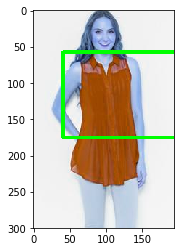

(230, 300, 3)
{'predit_class_index': 37, 'predict_class_label': 'Skirt', 'predict_bbox': array([0.05241761, 0.0796434 , 1.0381346 , 0.9694197 ], dtype=float32), 'confidence': 0.54813135}
(15, 18, 238, 290)


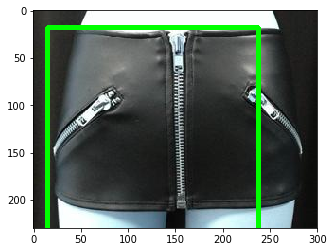

(300, 300, 3)
{'predit_class_index': 20, 'predict_class_label': 'Culottes', 'predict_bbox': array([0.29009634, 0.03934839, 0.8067014 , 0.8850701 ], dtype=float32), 'confidence': 0.45666978}
(87, 11, 242, 265)


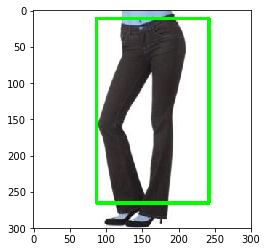

(1028, 1188, 3)
{'predit_class_index': 42, 'predict_class_label': 'Peacoat', 'predict_bbox': array([0.14946166, 0.21130046, 1.0104796 , 1.0823357 ], dtype=float32), 'confidence': 0.92978597}
(177, 217, 1038, 1285)


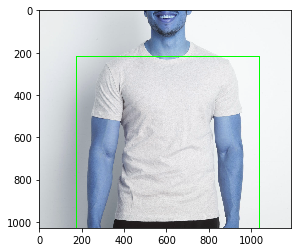

(107, 78, 3)
{'predit_class_index': 38, 'predict_class_label': 'Jeans', 'predict_bbox': array([0.22335403, 0.02301279, 0.7551702 , 0.88492656], dtype=float32), 'confidence': 0.19661848}
(17, 2, 80, 69)


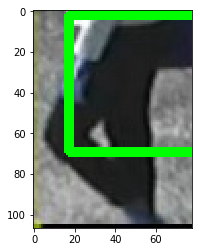

(115, 61, 3)
{'predit_class_index': 42, 'predict_class_label': 'Peacoat', 'predict_bbox': array([0.06696597, 0.20700535, 1.0725249 , 1.0522784 ], dtype=float32), 'confidence': 0.61771727}
(4, 23, 123, 64)


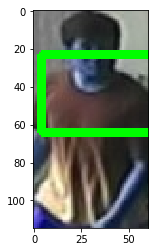

In [78]:
%matplotlib inline
#The line above is necesary to show Matplotlib's plots inside a Jupyter Notebook
from matplotlib import pyplot as plt

#Import image
for testImagePath in testImages:
    pltImage = cv2.imread(testImagePath)
    shape = pltImage.shape
    print(shape)
    print testImageDicts[testImagePath]
    predict_bbox = testImageDicts[testImagePath]["predict_bbox"]
    scale_bbox = int(predict_bbox[0]*shape[1]),int(predict_bbox[1]*shape[0]),int(predict_bbox[2]*shape[0]),int(predict_bbox[3]*shape[1])
    print scale_bbox
    pltImage = cv2.rectangle(pltImage,(scale_bbox[0],scale_bbox[1]),(scale_bbox[2],scale_bbox[3]),(0,255,0),3)
    #Show the image with matplotlib
    plt.imshow(pltImage)
    plt.show()

In [9]:
index = np.argmax(preds[0])
print(index)
print label_map.keys()[label_map.values().index(index)]

38


NameError: name 'label_map' is not defined